## Creditworthnesss

In [1]:
import numpy as np
import pandas as pd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import uniform, randint
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, KFold, RandomizedSearchCV, train_test_split
from sklearn.metrics import auc,roc_curve, accuracy_score, confusion_matrix, roc_auc_score, classification_report, precision_recall_fscore_support
import xgboost as xgb
import os
import warnings
warnings.filterwarnings('ignore')
credit_df = pd.read_csv('credit_risk_dataset.csv')
credit_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [2]:
credit_df.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [3]:
credit_df.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [4]:
numeric_df = credit_df.select_dtypes(include=['number'])
num_cols = pd.DataFrame(credit_df[credit_df.select_dtypes(include=['float', 'int']).columns])
num_cols.columns

Index(['person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_cred_hist_length'],
      dtype='object')

In [5]:
credit_df = credit_df.dropna()
credit_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28638 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  28638 non-null  int64  
 1   person_income               28638 non-null  int64  
 2   person_home_ownership       28638 non-null  object 
 3   person_emp_length           28638 non-null  float64
 4   loan_intent                 28638 non-null  object 
 5   loan_grade                  28638 non-null  object 
 6   loan_amnt                   28638 non-null  int64  
 7   loan_int_rate               28638 non-null  float64
 8   loan_status                 28638 non-null  int64  
 9   loan_percent_income         28638 non-null  float64
 10  cb_person_default_on_file   28638 non-null  object 
 11  cb_person_cred_hist_length  28638 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 2.8+ MB


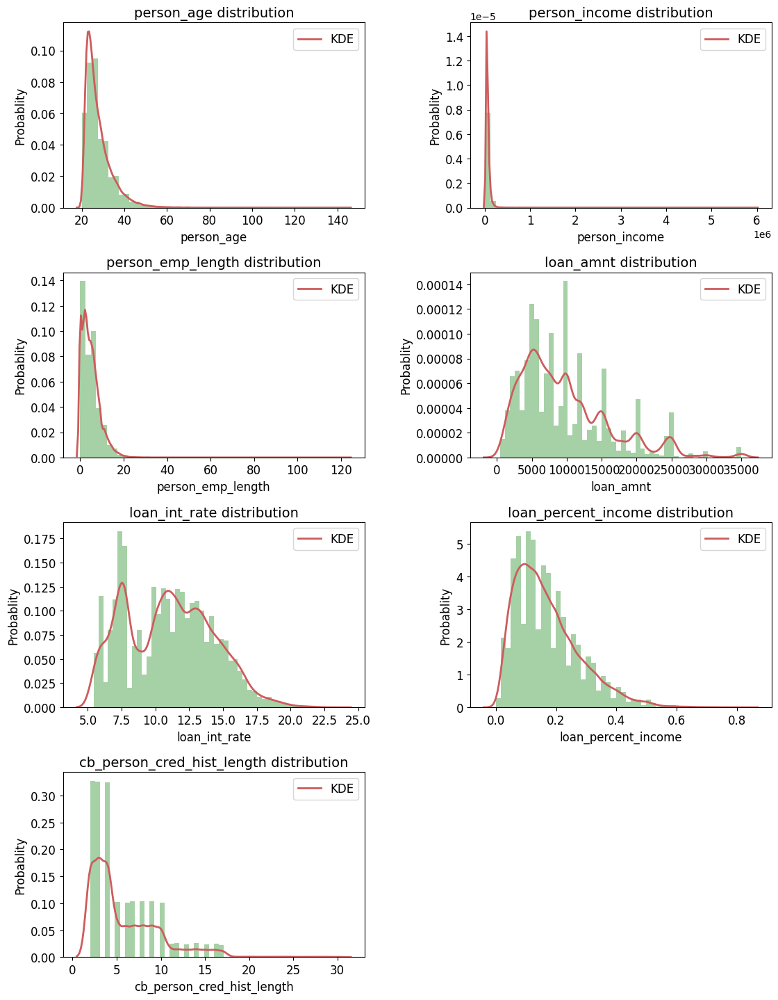

In [6]:
# Let's drop the target variable ['loan_status']

num_cols_hist = num_cols.drop(['loan_status'], axis=1)

# Plot graph
plt.figure(figsize=(12,16))

for i, col in enumerate(num_cols_hist.columns):
    idx = int('42'+ str(i+1))
    plt.subplot(idx)
    sns.distplot(num_cols_hist[col], color='forestgreen', 
                 kde_kws={'color': 'indianred', 'lw': 2, 'label': 'KDE'})
    plt.title(col+' distribution', fontsize=14)
    plt.ylabel('Probablity', fontsize=12)
    plt.xlabel(col, fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(['KDE'], prop={"size":12})

plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.35,
                    wspace=0.35)
plt.show()

## Data preprocessing

In [7]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import make_column_selector, make_column_transformer

def ratio_name(function_transformer, feature_names_in):
    return feature_names_in  # feature names out
def round_to_three_decimals(x):
    return np.round(x, decimals=3)
    
bool_transformer = FunctionTransformer(np.vectorize(lambda x: 1 if x == "Y" else 0))

bol_pip = make_pipeline(    
    FunctionTransformer(np.vectorize(lambda x: 1 if x == "Y" else 0), feature_names_out=ratio_name ),
)

log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler())


cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

num_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())

default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())

no_change = make_pipeline(SimpleImputer(strategy="median"))
preprocessing = ColumnTransformer([
        ("bool", bol_pip, ["cb_person_default_on_file"]),
        ("log", log_pipeline, ["person_age", "person_income", "cb_person_cred_hist_length"]),
        ("num", num_pipeline, ["loan_amnt","loan_int_rate","person_emp_length",  "loan_percent_income"]),
        ("impute", no_change , ["loan_status"]),
        ("cat",cat_pipeline,  make_column_selector(dtype_include=object)),   
    ],
        remainder=default_num_pipeline)
credit_df_prepare = preprocessing.fit_transform(credit_df)
print(credit_df_prepare)
credit_df_prepare.shape
preprocessing.get_feature_names_out()



[[ 1.         -1.06693618  0.08522063 ...  0.          0.
   1.        ]
 [ 0.         -1.30299034 -3.16696664 ...  0.          1.
   0.        ]
 [ 0.         -0.41827778 -3.16696664 ...  0.          1.
   0.        ]
 ...
 [ 0.          4.43022552  0.53871337 ...  0.          1.
   0.        ]
 [ 0.          3.67398183  1.75646847 ...  0.          1.
   0.        ]
 [ 0.          4.50769648 -0.52350799 ...  0.          1.
   0.        ]]


array(['bool__cb_person_default_on_file', 'log__person_age',
       'log__person_income', 'log__cb_person_cred_hist_length',
       'num__loan_amnt', 'num__loan_int_rate', 'num__person_emp_length',
       'num__loan_percent_income', 'impute__loan_status',
       'cat__person_home_ownership_MORTGAGE',
       'cat__person_home_ownership_OTHER',
       'cat__person_home_ownership_OWN',
       'cat__person_home_ownership_RENT',
       'cat__loan_intent_DEBTCONSOLIDATION', 'cat__loan_intent_EDUCATION',
       'cat__loan_intent_HOMEIMPROVEMENT', 'cat__loan_intent_MEDICAL',
       'cat__loan_intent_PERSONAL', 'cat__loan_intent_VENTURE',
       'cat__loan_grade_A', 'cat__loan_grade_B', 'cat__loan_grade_C',
       'cat__loan_grade_D', 'cat__loan_grade_E', 'cat__loan_grade_F',
       'cat__loan_grade_G', 'cat__cb_person_default_on_file_N',
       'cat__cb_person_default_on_file_Y'], dtype=object)

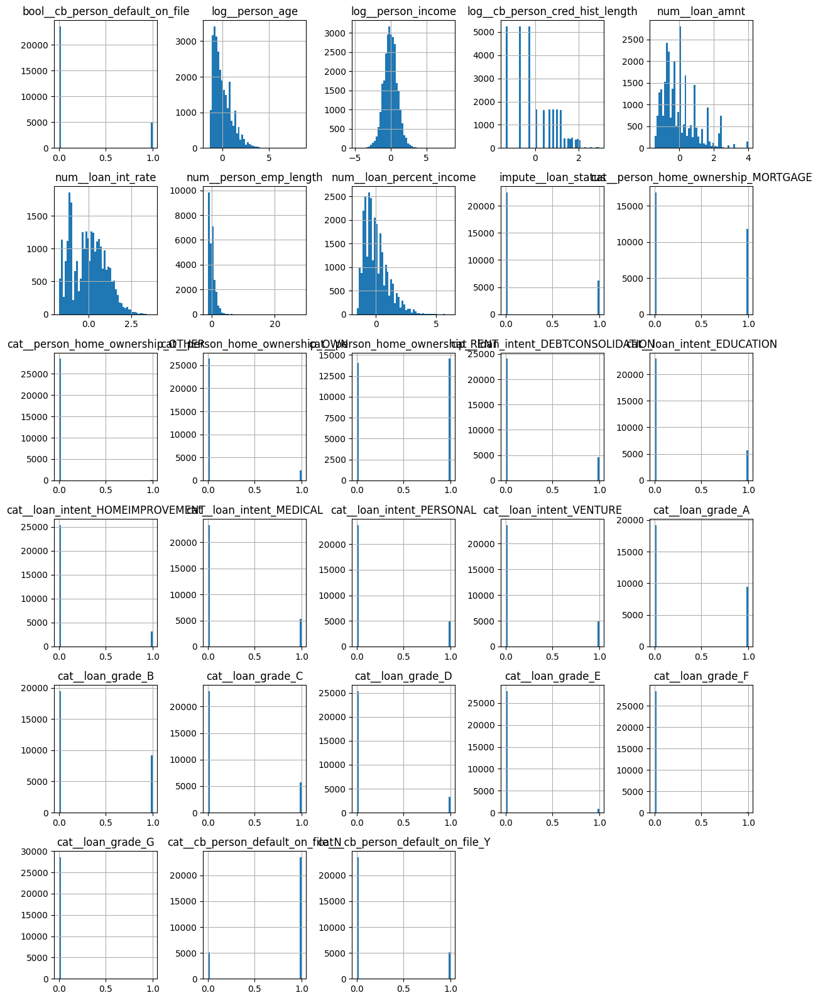

In [8]:
pre_credit = pd.DataFrame(credit_df_prepare, columns=preprocessing.get_feature_names_out())
pre_credit.hist(bins=50, figsize=(12, 16))
plt.tight_layout()
plt.show()

## build model

In [9]:
target = pre_credit['impute__loan_status']
features = pre_credit.drop('impute__loan_status', axis=1)
X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=42, test_size=0.2)

X_train.shape, y_train.shape

((22910, 27), (22910,))

In [10]:
def model_assess(model, name='Default'):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    preds_proba = model.predict_proba(X_test)
    print(name, '\n',classification_report(y_test, model.predict(X_test)))
    print('-'*60)

In [11]:
knn = KNeighborsClassifier(n_neighbors=150)
model_assess(knn, name='KNN')

log_reg = LogisticRegression(random_state=42)
model_assess(log_reg, 'LogisticRegression')

tree = DecisionTreeClassifier(max_depth=10, min_samples_split=2, min_samples_leaf=1, random_state=42)
model_assess(tree, 'DecisionTreeClassifier')

xgb_model = xgb.XGBClassifier(objective="binary:logistic", random_state=42)
model_assess(xgb_model, 'XGBoostClassifier')

KNN 
               precision    recall  f1-score   support

         0.0       0.86      0.98      0.92      4443
         1.0       0.88      0.46      0.61      1285

    accuracy                           0.87      5728
   macro avg       0.87      0.72      0.76      5728
weighted avg       0.87      0.87      0.85      5728

------------------------------------------------------------
LogisticRegression 
               precision    recall  f1-score   support

         0.0       0.88      0.96      0.92      4443
         1.0       0.79      0.55      0.65      1285

    accuracy                           0.87      5728
   macro avg       0.84      0.76      0.78      5728
weighted avg       0.86      0.87      0.86      5728

------------------------------------------------------------
DecisionTreeClassifier 
               precision    recall  f1-score   support

         0.0       0.92      0.99      0.96      4443
         1.0       0.97      0.71      0.82      1285

    accu

NameError: name 'probsxgb' is not defined

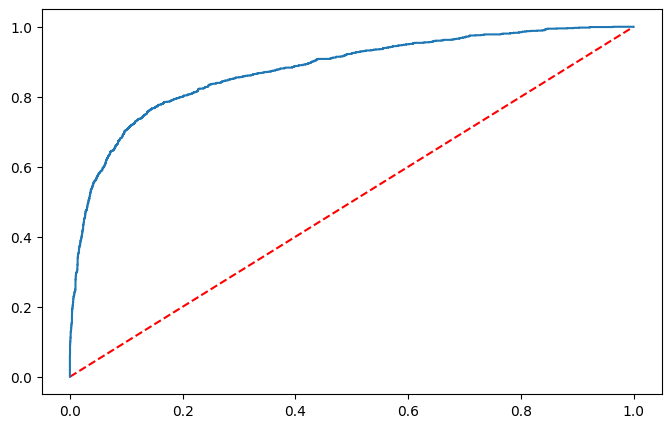

In [13]:
# Plot ROC curve

fig = plt.figure(figsize=(8,5))
plt.plot([0, 1], [0, 1],'r--')



#Logistic Regression
preds_proba_lg = log_reg.predict_proba(X_test)
probslg = preds_proba_lg[:, 1]
fpr, tpr, thresh = roc_curve(y_test, probslg)
auclg = roc_auc_score(y_test, probslg)
plt.plot(fpr, tpr, label=f'Logistic Regression, AUC = {str(round(auclg,3))}')
aucxgb = roc_auc_score(y_test, probsxgb)



plt.plot(fpr, tpr, label=f'XGBoost, AUC = {str(round(aucxgb,3))}')
plt.ylabel("True Positive Rate", fontsize=12)
plt.xlabel("False Positive Rate", fontsize=12)
plt.title("ROC curve")
plt.rcParams['axes.titlesize'] = 16
plt.legend()
plt.show()

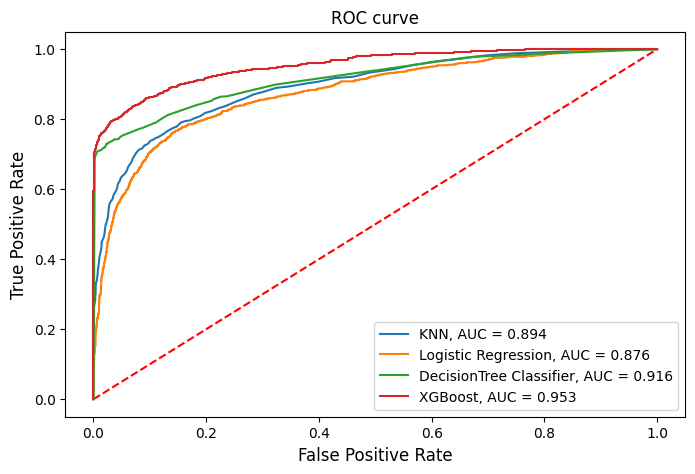

In [14]:
# Plot ROC curve

fig = plt.figure(figsize=(8,5))
plt.plot([0, 1], [0, 1],'r--')

#KNN
preds_proba_knn = knn.predict_proba(X_test)
probsknn = preds_proba_knn[:, 1]
fpr, tpr, thresh = roc_curve(y_test, probsknn)
aucknn = roc_auc_score(y_test, probsknn)
plt.plot(fpr, tpr, label=f'KNN, AUC = {str(round(aucknn,3))}')

#Logistic Regression
preds_proba_lg = log_reg.predict_proba(X_test)
probslg = preds_proba_lg[:, 1]
fpr, tpr, thresh = roc_curve(y_test, probslg)
auclg = roc_auc_score(y_test, probslg)
plt.plot(fpr, tpr, label=f'Logistic Regression, AUC = {str(round(auclg,3))}')

#DecisionTree Classifier
preds_proba_D_tree = tree.predict_proba(X_test)
probsD_tree = preds_proba_D_tree[:, 1]
fpr, tpr, thresh = roc_curve(y_test, probsD_tree)
auclg = roc_auc_score(y_test, probsD_tree)
plt.plot(fpr, tpr, label=f'DecisionTree Classifier, AUC = {str(round(auclg,3))}')

#XGBoost
preds_proba_xgb = xgb_model.predict_proba(X_test)
probsxgb = preds_proba_xgb[:, 1]
fpr, tpr, thresh = roc_curve(y_test, probsxgb)
aucxgb = roc_auc_score(y_test, probsxgb)
plt.plot(fpr, tpr, label=f'XGBoost, AUC = {str(round(aucxgb,3))}')
plt.ylabel("True Positive Rate", fontsize=12)
plt.xlabel("False Positive Rate", fontsize=12)
plt.title("ROC curve")
plt.rcParams['axes.titlesize'] = 16
plt.legend()
plt.show()

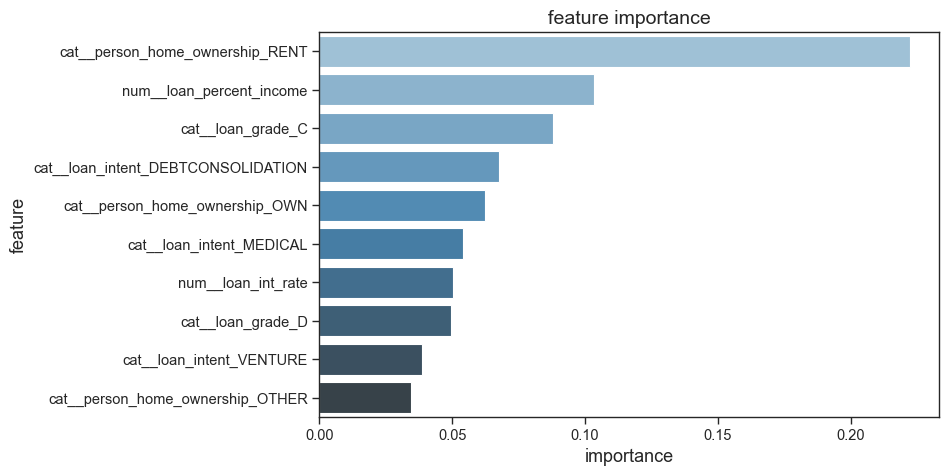

In [15]:
feature_importance = pd.DataFrame({'feature': X_train.columns, 
                                   'importance': xgb_model.feature_importances_})

new_features_df = feature_importance[feature_importance['importance']>0
                                    ].sort_values(by=['importance'],ascending=False)
sns.set(context='paper', style='ticks',  font='sans-serif', 
        font_scale=1.2, color_codes=True, rc=None)
figure, ax = plt.subplots(figsize=(8, 5))
ax=sns.barplot(data = new_features_df[:10],
              y='feature',
              x='importance',
              palette='Blues_d') # rocket, Blues_d
ax.set_title('feature importance', fontsize=14)
ax.set_xlabel('importance', fontsize=13)
ax.set_ylabel('feature', fontsize=13)
plt.show()

In [16]:
new_features_df.head(10)

,feature,importance
11,cat__person_home_ownership_RENT,0.222166
7,num__loan_percent_income,0.103188
20,cat__loan_grade_C,0.087838
12,cat__loan_intent_DEBTCONSOLIDATION,0.067455
10,cat__person_home_ownership_OWN,0.062194
15,cat__loan_intent_MEDICAL,0.054158
5,num__loan_int_rate,0.050245
21,cat__loan_grade_D,0.049724
17,cat__loan_intent_VENTURE,0.038477
9,cat__person_home_ownership_OTHER,0.034430


In [17]:
new_features = new_features_df['feature'][0:20]
new_features

11        cat__person_home_ownership_RENT
7                num__loan_percent_income
20                      cat__loan_grade_C
12     cat__loan_intent_DEBTCONSOLIDATION
10         cat__person_home_ownership_OWN
15               cat__loan_intent_MEDICAL
5                      num__loan_int_rate
21                      cat__loan_grade_D
17               cat__loan_intent_VENTURE
9        cat__person_home_ownership_OTHER
14       cat__loan_intent_HOMEIMPROVEMENT
8     cat__person_home_ownership_MORTGAGE
2                      log__person_income
24                      cat__loan_grade_G
6                  num__person_emp_length
13             cat__loan_intent_EDUCATION
16              cat__loan_intent_PERSONAL
22                      cat__loan_grade_E
1                         log__person_age
19                      cat__loan_grade_B
Name: feature, dtype: object

In [18]:
new_features_df = pd.DataFrame(pre_credit[new_features])
new_features_df.shape

(28638, 20)

In [19]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(new_features_df, target, 
                                                                    random_state=42, test_size=.30)
print('The train dataset has {} data\nThe test dataset has {} data'.
      format(X_train.shape[0], X_test.shape[0]))

The train dataset has 22910 data
The test dataset has 5728 data


In [20]:
params = {
    "colsample_bytree": uniform(0.9, 0.1), # 0.9-1 0.9 is the lower bound, 0.1 is the range
    "gamma": uniform(0.2, 0.3),# 0.2-0.5
    "learning_rate": uniform(0.2, 0.2), # 0.2-0.4 
    "max_depth": randint(4, 6), # 4, 5, 6
    "n_estimators": randint(100, 300), # 100-300
    "subsample": uniform(0.9, 0.1) # 0.9-1
}

Random_CV = RandomizedSearchCV(xgb_model, param_distributions=params, random_state=42, 
                            n_iter=100, cv=3, verbose=2, n_jobs=16, return_train_score=True)

Random_CV.fit(X_train1, y_train1)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                        'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000002403B0C0B10>,
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002403B0E6290>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002403B0E6FD0>,
                                        'subsample': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000002403B1E8690>},
                   random_state=42, return_train_score=True, verbose=2)

In [21]:
def report_best_scores(results, n_top=3):
    for i in range(1, n_top + 1):
        candidates = np.flatnonzero(results['rank_test_score'] == i)
        for candidate in candidates:
            print("Model with rank: {0}".format(i))
            print("Mean validation score: {0:.3f} (std: {1:.3f})".format(
                  results['mean_test_score'][candidate],
                  results['std_test_score'][candidate]))
            print("Parameters: {0}".format(results['params'][candidate]))
            print("")
report_best_scores(Random_CV.cv_results_, 3)

Model with rank: 1
Mean validation score: 0.935 (std: 0.004)
Parameters: {'colsample_bytree': 0.9057863897757708, 'gamma': 0.318356539582439, 'learning_rate': 0.22135121318717688, 'max_depth': 4, 'n_estimators': 107, 'subsample': 0.9169679903895566}

Model with rank: 2
Mean validation score: 0.935 (std: 0.002)
Parameters: {'colsample_bytree': 0.9646848361668724, 'gamma': 0.31648051519696163, 'learning_rate': 0.24587894914098996, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.9974394807666167}

Model with rank: 3
Mean validation score: 0.935 (std: 0.002)
Parameters: {'colsample_bytree': 0.9094442960755929, 'gamma': 0.40490203202490704, 'learning_rate': 0.2142377296920458, 'max_depth': 5, 'n_estimators': 192, 'subsample': 0.9844875310969454}



### Lime(model description)

In [22]:
best_model = Random_CV.best_estimator_


In [23]:
# Import necessary libraries
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Split the dataset into training and testing sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(new_features_df, target, random_state=42, test_size=0.30)

# Assuming best_model is already the best estimator from RandomizedSearchCV or GridSearchCV
best_model = Random_CV.best_estimator_

# Fit the model to the training data if not already done
best_model.fit(X_train1, y_train1)

# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train1.values, 
                                                   feature_names=X_train1.columns,
                                                   class_names=[str(cls) for cls in best_model.classes_],
                                                   verbose=True, mode='classification')

# Explain the first 5 instances from the test set
for i in range(5):
    instance = X_test1.iloc[i].values.reshape(1, -1)
    exp = explainer.explain_instance(instance[0], best_model.predict_proba, num_features=10)
    exp.show_in_notebook(show_table=True)
    # Alternatively, you can save the explanations as HTML files
    # exp.save_to_file(f'explanation_{i}.html')

Intercept 0.6369034790591013
Prediction_local [0.09393476]
Right: 0.03454035


Intercept 0.45136883355007557
Prediction_local [0.56740494]
Right: 0.9946626


Intercept 0.8187492344693581
Prediction_local [0.02042403]
Right: 0.014285714


Intercept 0.758069327948822
Prediction_local [0.1547506]
Right: 0.07376893


Intercept 0.44493966308777544
Prediction_local [0.59086567]
Right: 0.87339956


In [24]:
# Import necessary libraries
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Split the dataset into training and testing sets
X_train1, X_test1, y_train1, y_test1 = train_test_split(new_features_df, target, random_state=42, test_size=0.30)

# Assuming best_model is already the best estimator from RandomizedSearchCV or GridSearchCV
best_model = Random_CV.best_estimator_

# Fit the model to the training data if not already done
best_model.fit(X_train1, y_train1)

# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train1.values, 
                                                   feature_names=X_train1.columns,
                                                   class_names=[str(cls) for cls in best_model.classes_],
                                                   verbose=True, mode='classification')

# Explain the first instance from the test set
instance = X_test1.iloc[0].values.reshape(1, -1)
exp = explainer.explain_instance(instance[0], best_model.predict_proba, num_features=len(X_train1.columns))

# Show the explanation
exp.show_in_notebook(show_table=True)

Intercept 0.7786838287465374
Prediction_local [0.02831523]
Right: 0.03454035


### using shap

In [25]:
import shap
best_model = Random_CV.best_estimator_


In [26]:
explainer = shap.Explainer(best_model, X_train1, model_output="probability")


In [27]:
shap_values = explainer(X_test1)


 97%|=================== | 8373/8592 [00:15<00:00]       

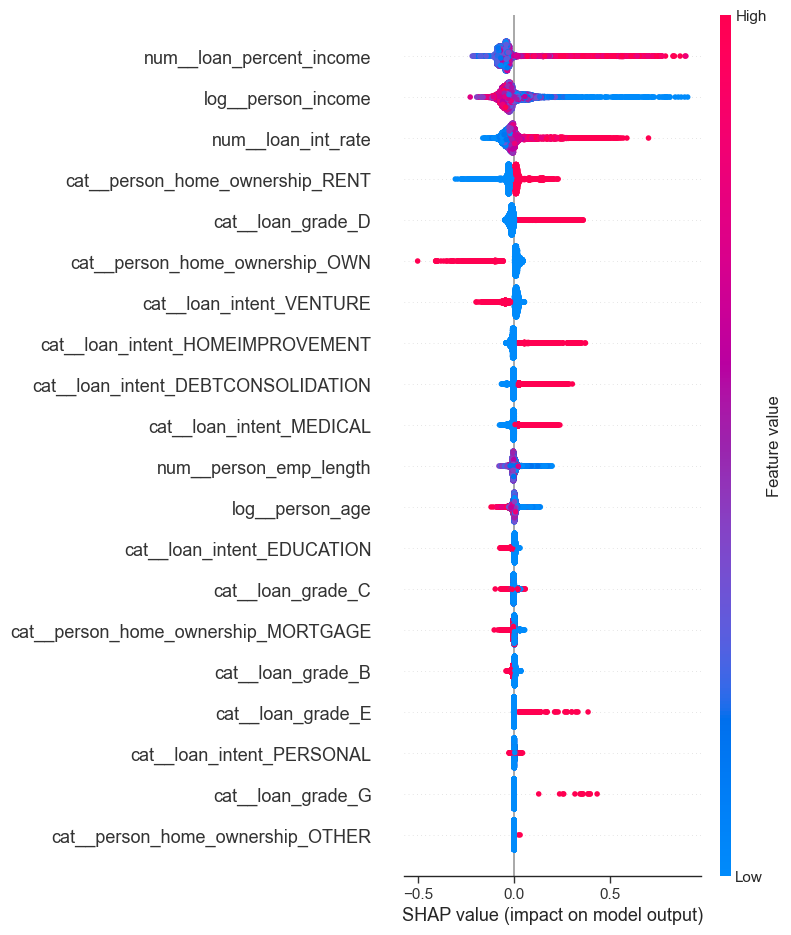

In [28]:
shap.summary_plot(shap_values, X_test1)


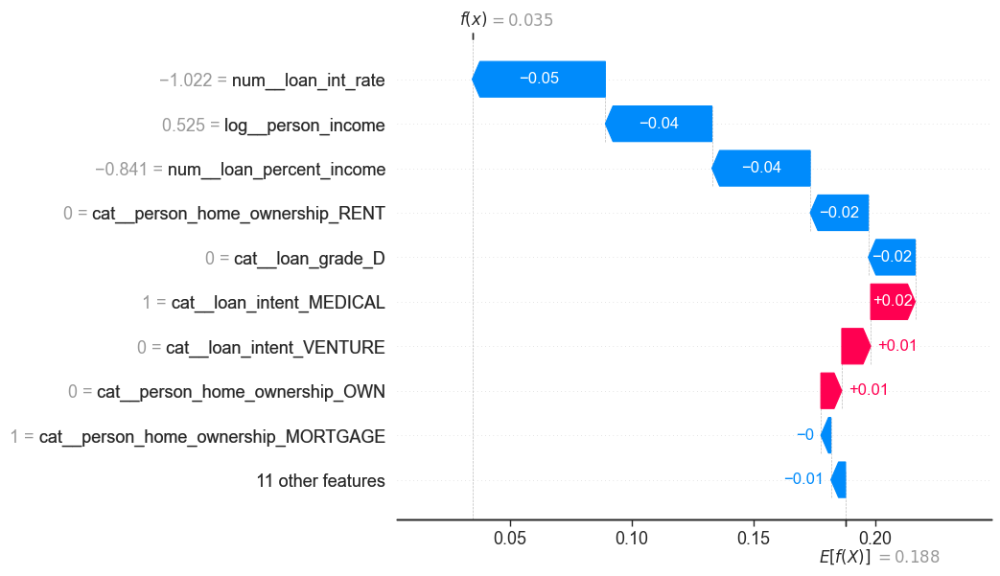

In [29]:
shap.plots.waterfall(shap_values[0])

In [30]:

# Get feature index from feature names if necessary
feature_names = X_test1.columns.tolist()
print(feature_names)

['cat__person_home_ownership_RENT', 'num__loan_percent_income', 'cat__loan_grade_C', 'cat__loan_intent_DEBTCONSOLIDATION', 'cat__person_home_ownership_OWN', 'cat__loan_intent_MEDICAL', 'num__loan_int_rate', 'cat__loan_grade_D', 'cat__loan_intent_VENTURE', 'cat__person_home_ownership_OTHER', 'cat__loan_intent_HOMEIMPROVEMENT', 'cat__person_home_ownership_MORTGAGE', 'log__person_income', 'cat__loan_grade_G', 'num__person_emp_length', 'cat__loan_intent_EDUCATION', 'cat__loan_intent_PERSONAL', 'cat__loan_grade_E', 'log__person_age', 'cat__loan_grade_B']


In [31]:
# import pandas as pd
# import shap
# import matplotlib.pyplot as plt

# # Assuming you have already computed the SHAP values and feature names
# # shap_values = explainer(X_test1)
# # feature_names = X_test1.columns.tolist()

# # Convert SHAP values to a DataFrame
# shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# # Initialize a dictionary to store distribution tables
# distribution_tables = {}

# # Iterate over all features
# for feature in feature_names:
#     # Create a binary column based on whether the SHAP value for the feature is > 0 or <= 0
#     X_test1[f'shap_binary_{feature}'] = shap_df[feature] > 0
    
#     # Group by the binary column and calculate the distribution of the attribute
#     distribution = X_test1.groupby(f'shap_binary_{feature}')[feature].describe()
    
#     # Store the distribution table in the dictionary
#     distribution_tables[feature] = distribution
    
#     # Print the distribution table
#     print(f'Distribution for {feature}:')
#     print(distribution)
#     print('\n')
    
#     # Plot the distribution table
#     distribution.plot(kind='bar')
#     plt.title(f'Distribution of {feature} based on SHAP value threshold 0')
#     plt.xlabel('SHAP value > 0')
#     plt.ylabel('Distribution')
#     plt.show()

In [32]:
# import pandas as pd
# import shap
# import matplotlib.pyplot as plt

# # Assuming you have already computed the SHAP values and feature names
# # shap_values = explainer(X_test1)
# # feature_names = X_test1.columns.tolist()

# # Convert SHAP values to a DataFrame
# shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# # List of intent-related features
# intent_features = [
#     'cat__loan_intent_DEBTCONSOLIDATION',
#     'cat__loan_intent_MEDICAL',
#     'cat__loan_intent_VENTURE',
#     'cat__loan_intent_HOMEIMPROVEMENT',
#     'cat__loan_intent_EDUCATION',
#     'cat__loan_intent_PERSONAL'
# ]

# # Initialize a dictionary to store distribution tables
# distribution_tables = {}

# # Iterate over intent features
# for feature in intent_features:
#     # Create a binary column based on whether the SHAP value for the feature is > 0 or <= 0
#     X_test1[f'shap_binary_{feature}'] = shap_df[feature] > 0
    
#     # Group by the binary column and calculate the distribution of the attribute
#     distribution = X_test1.groupby(f'shap_binary_{feature}')[feature].describe()
    
#     # Store the distribution table in the dictionary
#     distribution_tables[feature] = distribution
    
#     # Print the distribution table
#     print(f'Distribution for {feature}:')
#     print(distribution)
#     print('\n')
    
#     # Plot the distribution table
#     distribution.plot(kind='bar')
#     plt.title(f'Distribution of {feature} based on SHAP value threshold 0')
#     plt.xlabel('SHAP value > 0')
#     plt.ylabel('Distribution')
#     plt.show()

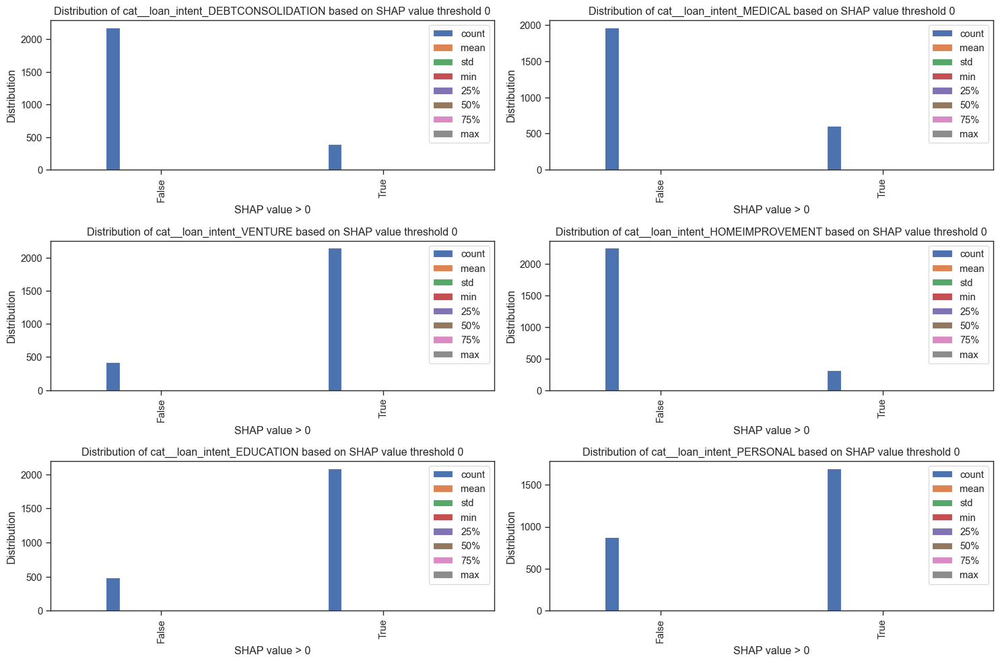

In [33]:
import pandas as pd
import shap
import matplotlib.pyplot as plt

# Assuming you have already computed the SHAP values and feature names
# shap_values = explainer(X_test1)
# feature_names = X_test1.columns.tolist()

# Convert SHAP values to a DataFrame
shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# List of intent-related features
intent_features = [
    'cat__loan_intent_DEBTCONSOLIDATION',
    'cat__loan_intent_MEDICAL',
    'cat__loan_intent_VENTURE',
    'cat__loan_intent_HOMEIMPROVEMENT',
    'cat__loan_intent_EDUCATION',
    'cat__loan_intent_PERSONAL'
]

# Initialize a dictionary to store distribution tables
distribution_tables = {}

# Create subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 10))
axes = axes.flatten()

# Iterate over intent features
for i, feature in enumerate(intent_features):
    # Create a binary column based on whether the SHAP value for the feature is > 0 or <= 0
    X_test1[f'shap_binary_{feature}'] = shap_df[feature] > 0
    
    # Group by the binary column and calculate the distribution of the attribute
    distribution = X_test1.groupby(f'shap_binary_{feature}')[feature].describe()
    
    # Store the distribution table in the dictionary
    distribution_tables[feature] = distribution
    
    # Plot the distribution table
    distribution.plot(kind='bar', ax=axes[i])
    axes[i].set_title(f'Distribution of {feature} based on SHAP value threshold 0')
    axes[i].set_xlabel('SHAP value > 0')
    axes[i].set_ylabel('Distribution')

# Adjust layout
plt.tight_layout()
plt.show()


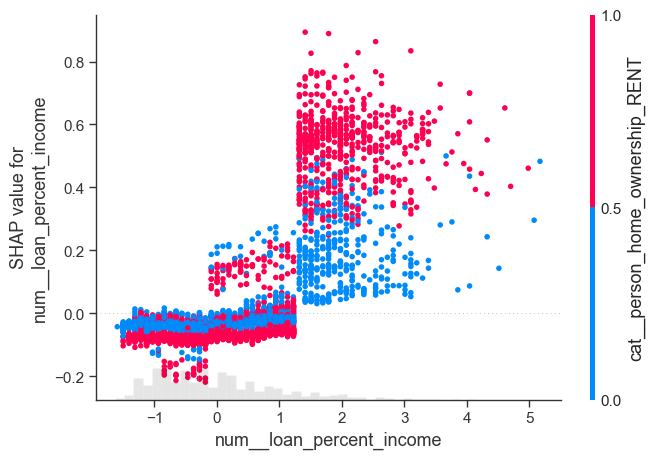

In [34]:
import shap
import matplotlib.pyplot as plt

# Assuming shap_values is already calculated
feature_names = X_test1.columns.tolist()
index_loan_percent_income = feature_names.index("num__loan_percent_income")
index_home_ownership_rent = feature_names.index("cat__person_home_ownership_RENT")

# Generate the dependence plot
shap.plots.scatter(shap_values[:, index_loan_percent_income],
                   color=shap_values[:, index_home_ownership_rent])

# Show the plot
plt.show()

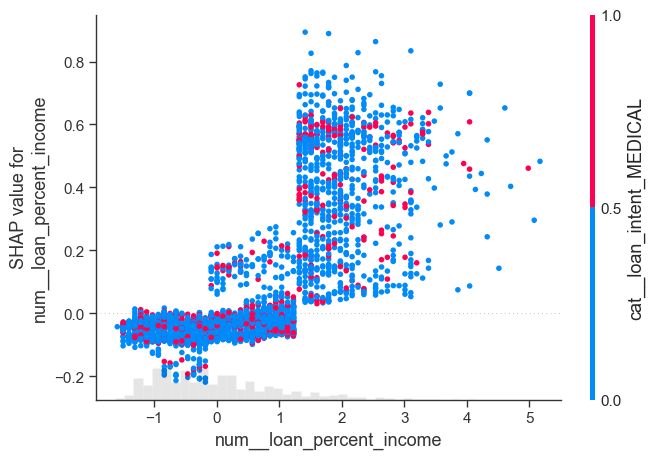

In [35]:
import shap
import matplotlib.pyplot as plt

# Assuming shap_values is already calculated
feature_names = X_test1.columns.tolist()
index_loan_percent_income = feature_names.index("num__loan_percent_income")
index_home_ownership_rent = feature_names.index("cat__loan_intent_MEDICAL")

# Generate the dependence plot
shap.plots.scatter(shap_values[:, index_loan_percent_income],
                   color=shap_values[:, index_home_ownership_rent])

# Show the plot
plt.show()

In [36]:
# import shap  # SHAP (SHapley Additive exPlanations) is used for model interpretability
# import matplotlib.pyplot as plt  # Matplotlib is used for plotting

# # Assuming shap_values is already calculated and contains SHAP values for the test dataset
# feature_names = X_test1.columns.tolist()  # Extract the feature names from the test dataset

# # Get the index of the features in the feature names list
# index_loan_percent_income = feature_names.index("num__loan_percent_income")
# index_debt_consolidation = feature_names.index("cat__loan_intent_DEBTCONSOLIDATION")
# index_home_ownership_own = feature_names.index("cat__person_home_ownership_OWN")
# index_medical = feature_names.index("cat__loan_intent_MEDICAL")
# index_venture = feature_names.index("cat__loan_intent_VENTURE")
# index_home_improvement = feature_names.index("cat__loan_intent_HOMEIMPROVEMENT")
# index_home_ownership_mortgage = feature_names.index("cat__person_home_ownership_MORTGAGE")
# index_emp_length = feature_names.index("num__person_emp_length")
# index_education = feature_names.index("cat__loan_intent_EDUCATION")
# index_personal = feature_names.index("cat__loan_intent_PERSONAL")
# index_person_age = feature_names.index("log__person_age")

# # List of indices for features to use as color
# color_indices = [index_debt_consolidation, index_home_ownership_own, index_medical, index_venture,
#                  index_home_improvement, index_home_ownership_mortgage, index_emp_length,
#                  index_education, index_personal, index_person_age]

# # Generate and display the dependence plots
# for color_index in color_indices:
#     # Generate the dependence plot
#     shap.plots.scatter(shap_values[:, index_loan_percent_income],  # SHAP values for the loan percent income feature
#                        color=shap_values[:, color_index])  # Coloring by SHAP values of the current feature

#     # Show the plot
#     plt.show()  # Display the plot. use subplot

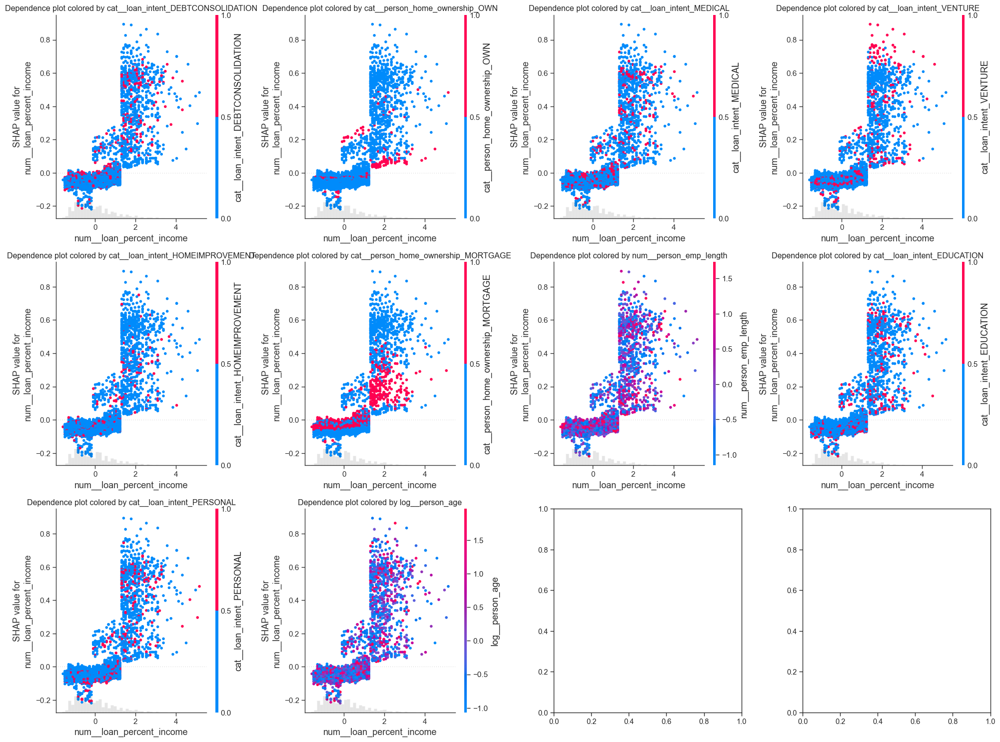

In [37]:
import shap  # SHAP (SHapley Additive exPlanations) is used for model interpretability
import matplotlib.pyplot as plt  # Matplotlib is used for plotting

# Assuming shap_values is already calculated and contains SHAP values for the test dataset
feature_names = X_test1.columns.tolist()  # Extract the feature names from the test dataset

# Get the index of the features in the feature names list
index_loan_percent_income = feature_names.index("num__loan_percent_income")
index_debt_consolidation = feature_names.index("cat__loan_intent_DEBTCONSOLIDATION")
index_home_ownership_own = feature_names.index("cat__person_home_ownership_OWN")
index_medical = feature_names.index("cat__loan_intent_MEDICAL")
index_venture = feature_names.index("cat__loan_intent_VENTURE")
index_home_improvement = feature_names.index("cat__loan_intent_HOMEIMPROVEMENT")
index_home_ownership_mortgage = feature_names.index("cat__person_home_ownership_MORTGAGE")
index_emp_length = feature_names.index("num__person_emp_length")
index_education = feature_names.index("cat__loan_intent_EDUCATION")
index_personal = feature_names.index("cat__loan_intent_PERSONAL")
index_person_age = feature_names.index("log__person_age")

# List of indices for features to use as color
color_indices = [index_debt_consolidation, index_home_ownership_own, index_medical, index_venture,
                 index_home_improvement, index_home_ownership_mortgage, index_emp_length,
                 index_education, index_personal, index_person_age]

# Set up the figure for subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 15))  # Create a 3x4 grid for subplots
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Generate and display the dependence plots
for i, color_index in enumerate(color_indices):
    # Generate the dependence plot on the specified subplot axis
    shap.plots.scatter(shap_values[:, index_loan_percent_income],  # SHAP values for the loan percent income feature
                       color=shap_values[:, color_index],  # Coloring by SHAP values of the current feature
                       show = False,
                       ax=axes[i])  # Specify the subplot axis

    # Set title for the subplot
    axes[i].set_title(f'Dependence plot colored by {feature_names[color_index]}')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()  # Display all the plots in a single figure


In [38]:
scaler = log_pipeline.named_steps['standardscaler']

print(scaler)

StandardScaler()


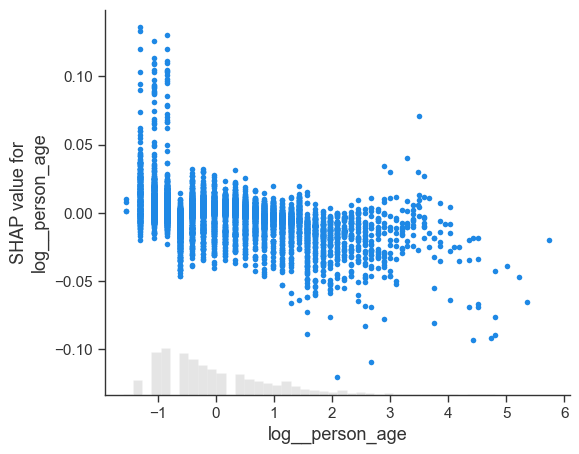

In [48]:
import shap
import matplotlib.pyplot as plt

# Assuming shap_values is already calculated
feature_names = X_test1.columns.tolist()
index_loan_percent_income = feature_names.index("log__person_age")

# Generate the dependence plot
shap.plots.scatter(shap_values[:, index_loan_percent_income])

# Show the plot
plt.show()

In [40]:
credit_df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [49]:
num_pipeline = preprocessing.named_transformers_['num']
scaler = num_pipeline.named_steps['standardscaler']
mean_emp = scaler.mean_[2]
scale_emp = scaler.scale_[2]


# Reverse StandardScaler for 'person_age'
original = (-0.8* scale_emp) + mean_emp
original1 = (2* scale_emp) + mean_emp
original2 = (4* scale_emp) + mean_emp
original3 = (6* scale_emp) + mean_emp

print(f"Original emp: {original, original1, original2, original3}")

Original emp: (1.4650290872478573, 13.097780658512804, 21.40688892370205, 29.715997188891297)


In [42]:
X_test1.head()

,cat__person_home_ownership_RENT,num__loan_percent_income,cat__loan_grade_C,cat__loan_intent_DEBTCONSOLIDATION,cat__person_home_ownership_OWN,cat__loan_intent_MEDICAL,num__loan_int_rate,cat__loan_grade_D,cat__loan_intent_VENTURE,cat__person_home_ownership_OTHER,...,cat__loan_intent_PERSONAL,cat__loan_grade_E,log__person_age,cat__loan_grade_B,shap_binary_cat__loan_intent_DEBTCONSOLIDATION,shap_binary_cat__loan_intent_MEDICAL,shap_binary_cat__loan_intent_VENTURE,shap_binary_cat__loan_intent_HOMEIMPROVEMENT,shap_binary_cat__loan_intent_EDUCATION,shap_binary_cat__loan_intent_PERSONAL
21781,0.0,-0.841127,0.0,0.0,0.0,1.0,-1.021847,0.0,0.0,0.0,...,0.0,0.0,-0.027758,0.0,NaN,NaN,NaN,NaN,NaN,NaN
16129,1.0,1.978669,1.0,0.0,0.0,0.0,0.619368,0.0,0.0,0.0,...,1.0,0.0,0.990495,0.0,NaN,NaN,NaN,NaN,NaN,NaN
12830,0.0,-1.217100,0.0,1.0,0.0,0.0,-1.275771,0.0,0.0,0.0,...,0.0,0.0,-0.219262,0.0,NaN,NaN,NaN,NaN,NaN,NaN
20940,0.0,-0.653141,1.0,0.0,0.0,0.0,1.309916,0.0,1.0,0.0,...,0.0,0.0,0.334842,0.0,NaN,NaN,NaN,NaN,NaN,NaN
18392,1.0,-0.559148,0.0,0.0,0.0,1.0,1.625773,1.0,0.0,0.0,...,0.0,0.0,0.156780,0.0,NaN,NaN,NaN,NaN,NaN,NaN


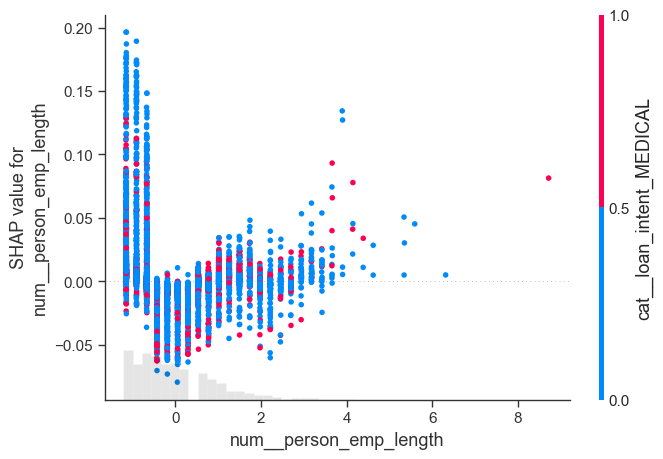

In [43]:

import shap
import matplotlib.pyplot as plt

# Assuming shap_values is already calculated
feature_names = X_test1.columns.tolist()
index_loan_percent_income = feature_names.index("num__person_emp_length")

# Generate the dependence plot
shap.plots.scatter(shap_values[:, index_loan_percent_income],
                   color=shap_values[:, index_home_ownership_rent])

# Show the plot
plt.show()

In [44]:
log_pipeline = preprocessing.named_transformers_['log']
scaler = log_pipeline.named_steps['standardscaler']
mean_age = scaler.mean_[0]
scale_age = scaler.scale_[0]


# Reverse StandardScaler for 'person_age'
reversed_log_age = (-0.4 * scale_age) + mean_age

# Reverse log transformation for 'person_age'
original_age = np.exp(reversed_log_age)
print(f"Original age: {original_age}")


Original age: 25.090214047509384


In [45]:
imputer = preprocessing.named_transformers_['log'].named_steps['simpleimputer']
scaler = preprocessing.named_transformers_['log'].named_steps['standardscaler']
def invert_transformations(transformed_data, imputer, scaler):
    # Invert the scaling
    original_scaled_data = transformed_data * np.sqrt(scaler.var_) + scaler.mean_
    # Invert the log transformation
    original_data = np.exp(original_scaled_data)
    return original_data
# Invert the transformations
original_data = invert_transformations(5, imputer, scaler)

print("Original data:", original_data)

Original data: [7.27242371e+01 9.17430593e+05 1.10164669e+02]


In [46]:
index_emp_length = feature_names.index("num__person_emp_length")
index_person_age = feature_names.index("log__person_age")


### threshold